# pix2pix Conditional GAN Architecture
"Image-to-image translation with a conditional GAN"
https://www.tensorflow.org/tutorials/generative/pix2pix

Get necessary imports

In [ ]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display
from google.colab import drive

Mount google drive to fetch dataset

In [ ]:
drive.mount('/content/drive')

PATH = pathlib.Path('/content/drive/MyDrive/data')
list(PATH.parent.iterdir())

sample_image = tf.io.read_file(str(PATH/'train/sketches/0.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)

plt.figure()
plt.imshow(sample_image)


KeyboardInterrupt: ignored

### Load image pairs as tensors

In [ ]:
def resize(sketch_image, photo_image, height, width):
  sketch_image = tf.image.resize(sketch_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  photo_image = tf.image.resize(photo_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return sketch_image, photo_image


In [ ]:
def load(file_name):
  photo_file = tf.strings.regex_replace(file_name, 'sketches', 'photos')
  sketch_image = tf.io.read_file(file_name)
  sketch_image = tf.io.decode_jpeg(sketch_image, 3)

  photo_image = tf.io.read_file(photo_file)
  photo_image = tf.io.decode_jpeg(photo_image)

  sketch_image = tf.cast(sketch_image, tf.float32)
  photo_image = tf.cast(photo_image, tf.float32)

  return sketch_image, photo_image


(512, 512, 3)


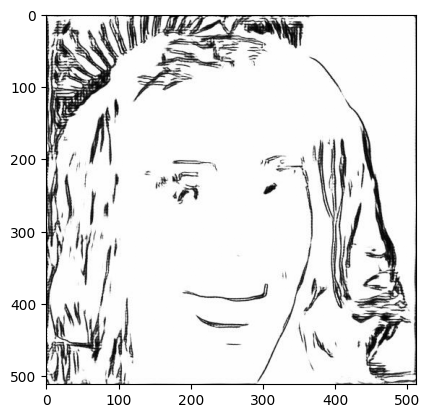

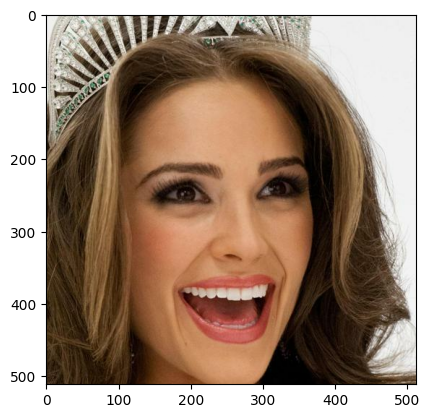

In [ ]:
sketch, photo = load(str(PATH / 'train/sketches/0.jpg'))
print(sketch.shape)
plt.figure()
plt.imshow(sketch / 255.0)
plt.figure()
plt.imshow(photo / 255.0)

#### Init constants

In [ ]:
BUFFER_SIZE = 404

BATCH_SIZE = 1

IMG_WIDTH = 512
IMG_HEIGHT = 512

In [ ]:
def random_crop(sketch_image, photo_image):
  stacked_image = tf.stack([sketch_image, photo_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]


In [ ]:
# Normalizing the images to [-1, 1]
def normalize(sketch_image, photo_image):
  sketch_image = (sketch_image / 255.5) - 1
  photo_image = (photo_image / 255.5) - 1

  return sketch_image, photo_image


In [ ]:
@tf.function()
def random_jitter(sketch_image, photo_image):
  # Resizing to h+20 x w+20
  sketch_image, photo_image = resize(sketch_image, photo_image, 532, 532)

  # Random cropping back to h x w
  sketch_image, photo_image = random_crop(sketch_image, photo_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    sketch_image = tf.image.flip_left_right(sketch_image)
    photo_image = tf.image.flip_left_right(photo_image)

  return sketch_image, photo_image


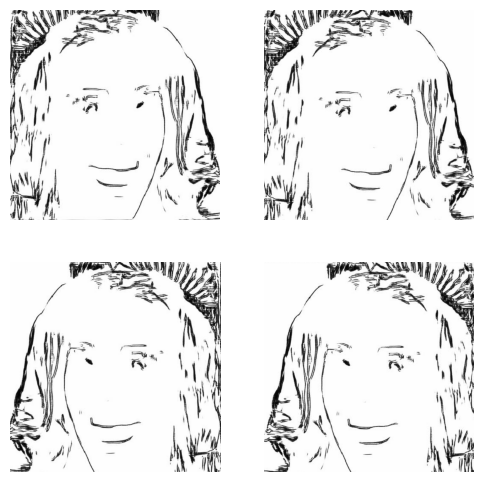

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(sketch, photo)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()


In [ ]:
def load_image_train(image_file):
  sketch_image, photo_image = load(image_file)
  sketch_image, photo_image = random_jitter(sketch_image, photo_image)
  sketch_image, photo_image = normalize(sketch_image, photo_image)

  return sketch_image, photo_image


In [ ]:
def load_image_test(image_file):
  sketch_image, photo_image = load(image_file)
  sketch_image, photo_image = resize(sketch_image, photo_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  sketch_image, photo_image = normalize(sketch_image, photo_image)

  return sketch_image, photo_image


In [ ]:
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/sketches/*.jpg'))

In [ ]:
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/sketches/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/sketches/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)


In [ ]:
OUTPUT_CHANNELS = 3


In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result


In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(sketch, 0))
print (down_result.shape)


(1, 256, 256, 3)


In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result


In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)


(1, 512, 512, 3)


In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[512, 512, 3])
  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 256, 256, 64)
    downsample(128, 4),  # (batch_size, 128, 128, 128)
    downsample(256, 4),  # (batch_size, 64, 64, 256)
    downsample(512, 4),  # (batch_size, 32, 32, 512)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 16, 16, 1024)
    upsample(512, 4),  # (batch_size, 32, 32, 1024)
    upsample(256, 4),  # (batch_size, 64, 64, 512)
    upsample(128, 4),  # (batch_size, 128, 128, 256)
    upsample(64, 4),  # (batch_size, 256, 256, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)


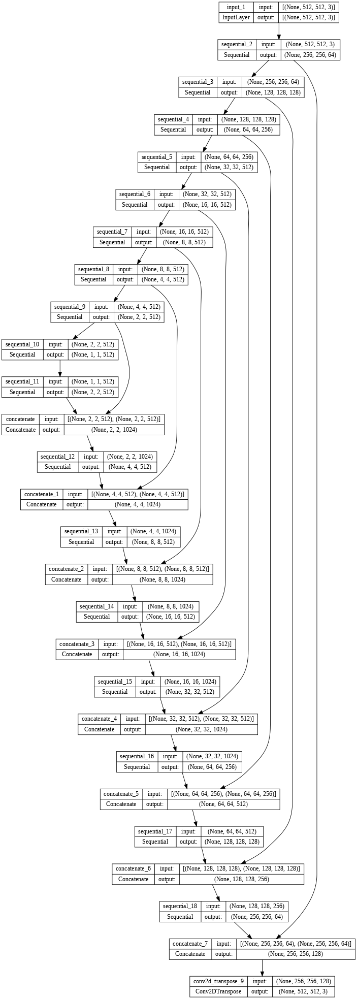

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)


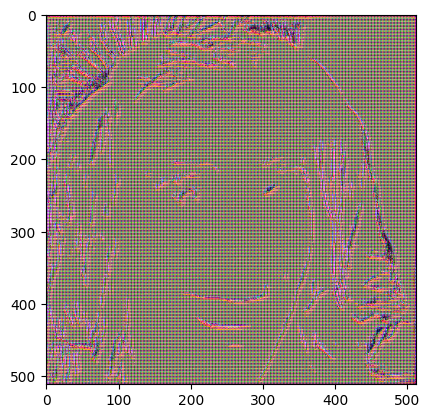

In [ ]:
gen_output = generator(sketch[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss


In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)
  inp = tf.keras.layers.Input(shape=[512, 512, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[512, 512, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 512, 512, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 256, 256, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 128, 128, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 64, 64, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 66, 66, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 63, 63, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 65, 65, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 62, 62, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)


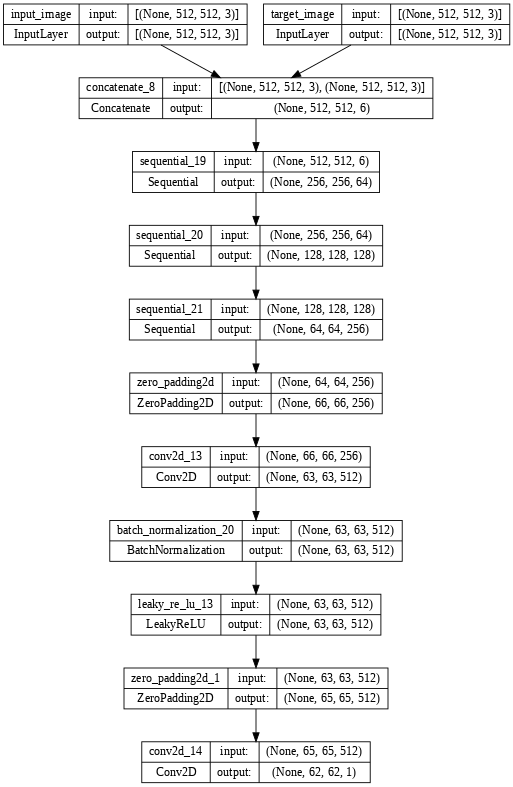

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)


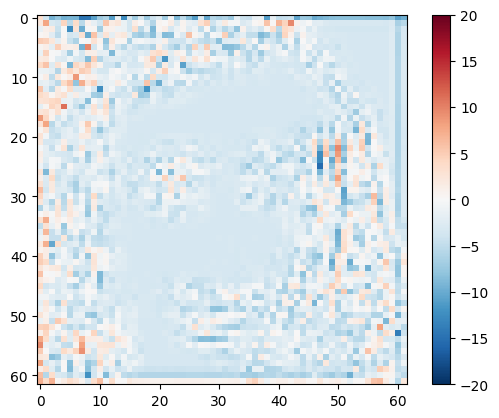

In [ ]:
disc_out = discriminator([sketch[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()


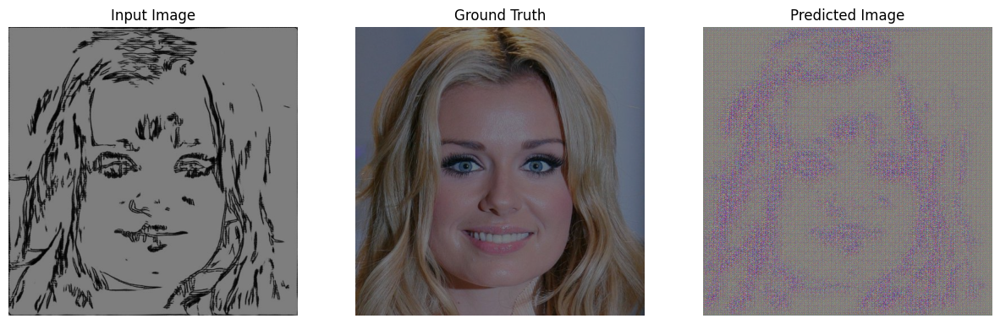

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)


In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))


In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)
    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)


In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()
  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)
    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)


In [ ]:
!kill 2683

/bin/bash: line 1: kill: (2683) - No such process


In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}


<IPython.core.display.Javascript object>

Time taken for 1000 steps: 24.08 sec



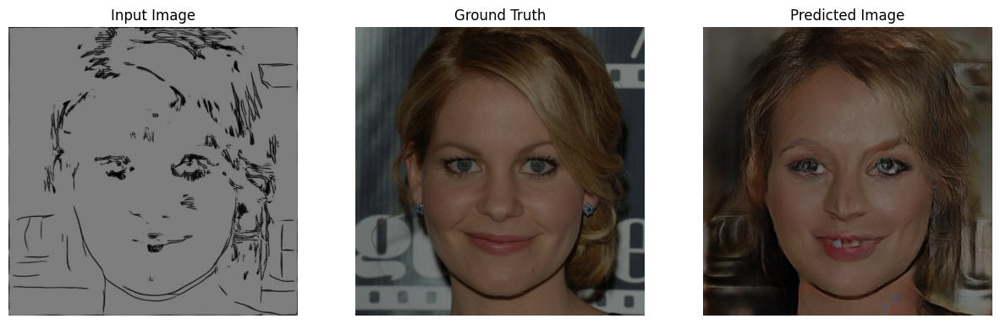

Step: 39k
....................................................................................................

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))


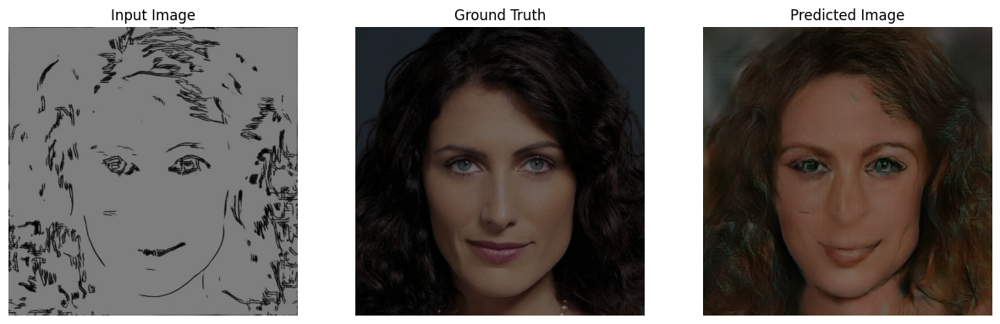

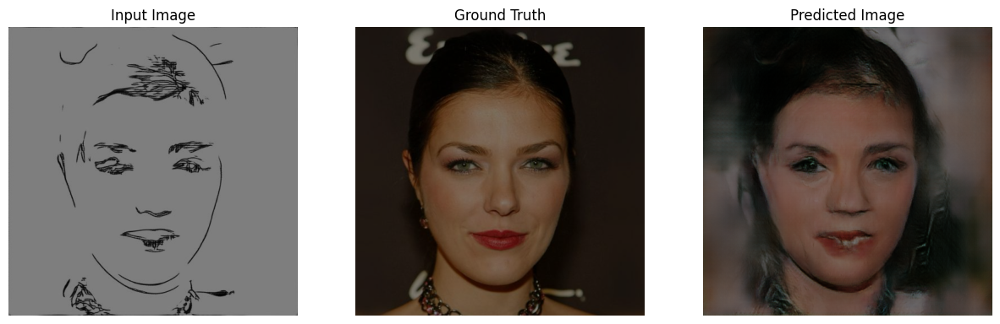

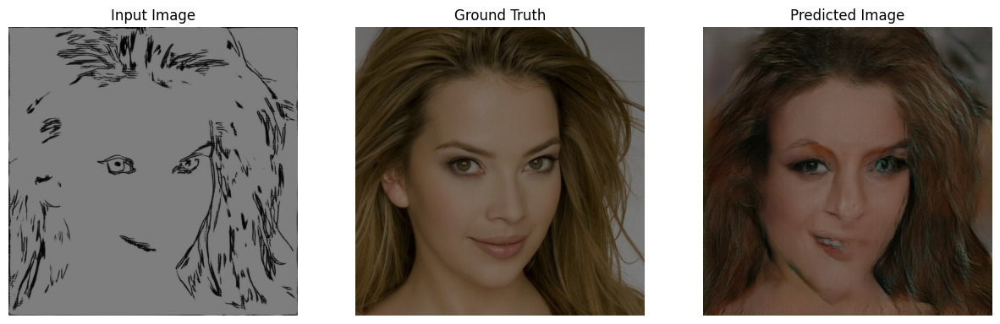

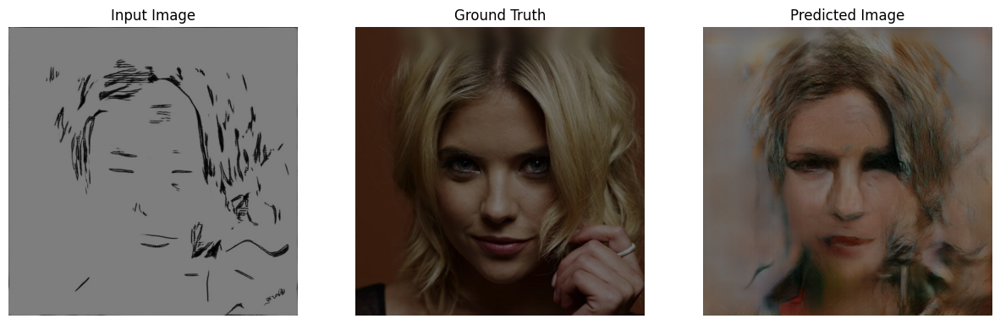

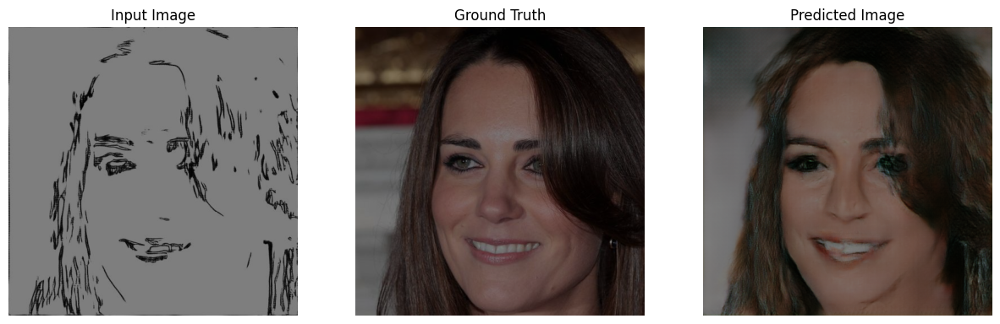

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

In [ ]:
def generate_single(model, test_input, tar, name):
  prediction = model(test_input, training=True)
  plt.figure()
  display = prediction[0]
  plt.imshow(display * 0.5 + 0.5)
  plt.axis('off')
  plt.tight_layout();
  plt.savefig('samples/{}.jpg'.format(name), bbox_inches='tight')
  plt.close()


In [ ]:
def save_tests(target, name):
  plt.figure()
  display = target[0]
  plt.imshow(display * 0.5 + 0.5)
  plt.axis('off')
  plt.tight_layout()
  plt.savefig('tests/{}.jpg'.format(name), bbox_inches='tight')
  plt.close()

In [ ]:
# Save test files to new dir
x = 0
for inp, tar in test_dataset:
  save_tests(tar, x)
  x += 1

In [ ]:
# Save generated test files
x = 0
for inp, tar in test_dataset:
  generate_single(generator, inp, tar, x)
  x += 1

In [ ]:
# Calculate FID score
!python fid.py /content/samples /content/tests

2023-08-09 01:04:37.378797: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-08-09 01:04:39.572184: W tensorflow/core/framework/op_def_util.cc:369] Op BatchNormWithGlobalNormalization is deprecated. It will cease to work in GraphDef version 9. Use tf.nn.batch_normalization().
2023-08-09 01:04:39.710944: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
/content/fid.py:297: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  x = np.array([imread(str(fn)).astype(np.float32) for fn in files])
FID:  67.23145264287525
